In [258]:
import numpy as np
from pathlib import Path

# Function for a double Gaussian
def double_gaussian(x, c):
    """
    Parameters:
        x : array-like
            Independent variable.
        c : array-like
            Coefficients for the Gaussian:
                c[0] - continuum (background) level
                c[1] - intensity of first Gaussian
                c[2] - centroid of first Gaussian
                c[3] - standard deviation of first Gaussian
                c[4] - intensity of second Gaussian
                c[5] - centroid of second Gaussian
                c[6] - standard deviation of second Gaussian

    Returns:
        model : array-like
            Double Gaussian model.
    """
    gauss_1 = c[1] * np.exp(-((x - c[2]) ** 2) / (2 * c[3] ** 2))
    gauss_2 = c[4] * np.exp(-((x - c[5]) ** 2) / (2 * c[6] ** 2))
    model = c[0] + gauss_1 + gauss_2
    return model

# Main program
# Configuration settings
hard = 0  # 0 for screen plot, 1 for hard copy

# Folder and file paths
base_path = Path("E:/Simon_Files/oct252014/FitsResults")
file_name = "SiIV1394_25Oct2014_Region1.fits"
#file_name = "SiIV1394_25Oct2014_Region2.fits"
#file_name = "O_IV1401_25Oct2014_Region1.fits"
#file_name = "O_IV1401_25Oct2014_Region2.fits"
#file_name = "SiIV1403_25Oct2014_Region1.fits"
#file_name = "SiIV1403_25Oct2014_Region2.fits"
results_folder_name = Path("E:/Simon_Files/oct252014/GraphicResults")

# Averaging time interval for smoothing plots
averaging_time_interval = 0

# Placeholder for colors (depends on plotting library like matplotlib)
white = "white"  # Example: matplotlib's named color
black = "black"

# Plotting settings (using matplotlib default styles as a placeholder)
plot_settings = {
    "char_size": 1,
    "char_thickness": 1,
    "line_thickness": 1,
    "x_axis_thickness": 1,
    "y_axis_thickness": 1,
    "z_axis_thickness": 1,
    "background_color": black,
    "axis_color": white,
}

In [259]:
# Extract substring values based on file_name
species = file_name[:8]
region = file_name[-12:-5]
event_date = file_name[-22:-13]

# Validate and determine properties of the spectral line under observation
if species not in ["SiIV1394", "SiIV1403", "O_IV1401"]:
    raise ValueError("Impossible to Determine Ion Species from Filename")

# Set properties based on species
if species == "SiIV1394":
    t_formation = 7.0e4  # Formation temperature for Si IV (K)
    ion_mass = 28.0 * 1.67e-24  # Mass of Si ion in grams
    rest_wavelength = 1393.755  # Rest wavelength in Angstroms
elif species == "SiIV1403":
    t_formation = 7.0e4  # Formation temperature for Si IV (K)
    ion_mass = 28.0 * 1.67e-24  # Mass of Si ion in grams
    rest_wavelength = 1402.77  # Rest wavelength in Angstroms
elif species == "O_IV1401":
    t_formation = 15.0e4  # Formation temperature for O IV (K)
    ion_mass = 16.0 * 1.67e-24  # Mass of O ion in grams
    rest_wavelength = 1401.157  # Rest wavelength in Angstroms

# Thermal velocity
v_thermal = np.sqrt(2.0 * 1.38e-16 * t_formation / ion_mass)  # v_th = sqrt(2 k T/m)

# Instrumental line width (1 standard deviation) in Angstroms
inst_width = 0.01214

# Validate and determine flare region
if region not in ["Region1", "Region2"]:
    raise ValueError("Impossible to Determine Flare Region from Filename")

# Set properties based on region
if region == "Region1":
    i_time_min = 148
    i_time_max = 162
    slit_pos_offset = 180
elif region == "Region2":
    i_time_min = 148
    i_time_max = 159
    slit_pos_offset = 40

In [260]:
from astropy.io import fits

# Read in data from FITS files
wavelength_arr, header = fits.getdata(base_path / file_name, 0, header=True) # 1D Array
intensity, _ = fits.getdata(base_path / file_name, 1, header=True)
time_arr, _ = fits.getdata(base_path / file_name, 2, header=True) # 1D Array

# Transpose the data arrays to match the expected shape from IDL (column-major -> row-major)
intensity = intensity.transpose((2, 1, 0))  # Shape change from (pixel, time, lambda) to (lambda, time, pixel)

# Determine size of arrays
n_lambda = len(wavelength_arr)
n_time = len(time_arr)
n_pixel = intensity.shape[2]  # n_pixel corresponds to the first dimension of transposed intensity

# Initialize arrays
intensity_pixel = np.zeros((n_time, n_pixel))  # Lightcurves for each pixel
intensity_pixel_plot = np.zeros((n_time, n_pixel))
intensity_overall = np.zeros(n_time)  # Overall lightcurve
intensity_err = np.zeros((n_lambda, n_time, n_pixel))  # Uncertainty in intensity (Poissonian)
warning_flag = np.zeros((n_time, n_pixel), dtype=int)  # Set to 1 if count in any channel exceeds 4000
fluence_pixel = np.zeros(n_pixel)  # Event-integrated fluence for each pixel

# Set warning flag for saturated pixels/times
for i_time in range(n_time):
    for slit_pos in range(n_pixel):
        for i_lambda in range(n_lambda):
            if intensity[i_lambda, i_time, slit_pos] > 4000:
                warning_flag[i_time, slit_pos] = 1

# Determine wavelength-integrated intensity for each pixel and time
for slit_pos in range(n_pixel):
    for i_time in range(n_time):
        intensity_pixel[i_time, slit_pos] = np.sum(intensity[:, i_time, slit_pos])

# Determine lightcurves for each pixel, excluding positions with warning flags
for i_time in range(n_time):
    for slit_pos in range(n_pixel):
        if warning_flag[i_time, slit_pos] == 0:
            intensity_pixel_plot[i_time, slit_pos] = intensity_pixel[i_time, slit_pos]
        else:
            intensity_pixel_plot[i_time, slit_pos] = -999.

# Determine time-integrated fluence for each pixel in the image during intensity peak times
for slit_pos in range(n_pixel):
    fluence_pixel[slit_pos] = np.sum(intensity_pixel[:, slit_pos])

# Determine lightcurve for the whole flare (including saturated 4000 values)
for i_time in range(n_time - 1):
    intensity_overall[i_time] = 0
    for slit_pos in range(n_pixel):
        for i_lambda in range(n_lambda - 1):
            intensity_overall[i_time] += intensity[i_lambda, i_time, slit_pos]

# Find time of maximum overall intensity and brightest three pixels (with no warning flag) at that time
brightest_time = np.where(intensity_overall == np.max(intensity_overall))[0][0]
brightest_pixels_sorted = np.argsort(intensity_pixel_plot[brightest_time,:])[-3:][::-1]
#brightest_pixels_sorted = np.sort(intensity_pixel_plot[brightest_time, :], axis=None)[::-1]

# Get the brightest slit positions for the top three pixels
slit_pos_array = [brightest_pixels_sorted[0], brightest_pixels_sorted[1], brightest_pixels_sorted[2]]
n_pos = len(slit_pos_array)

In [261]:
#Check yourself: Does line 3 have shape (4,5,6)? Does line 7 have (4) elements? Are the elements in (9) the 3 indices of the largest numbers in (8)?

print(np.shape(intensity))
print(n_lambda)
print(n_time)
print(n_pixel)
print(wavelength_arr)
print(intensity_pixel_plot[brightest_time,:])
print(brightest_pixels_sorted)
print(slit_pos_array)

(52, 601, 71)
52
601
71
[1393.39030787 1393.41574787 1393.44118787 1393.46662787 1393.49206787
 1393.51750787 1393.54294787 1393.56838787 1393.59382787 1393.61926787
 1393.64470787 1393.67014787 1393.69558787 1393.72102787 1393.74646787
 1393.77190787 1393.79734787 1393.82278787 1393.84822787 1393.87366787
 1393.89910787 1393.92454787 1393.94998787 1393.97542787 1394.00086787
 1394.02630787 1394.05174787 1394.07718787 1394.10262787 1394.12806787
 1394.15350787 1394.17894787 1394.20438787 1394.22982787 1394.25526787
 1394.28070787 1394.30614787 1394.33158787 1394.35702787 1394.38246787
 1394.40790787 1394.43334787 1394.45878787 1394.48422787 1394.50966787
 1394.53510787 1394.56054787 1394.58598787 1394.61142787 1394.63686787
 1394.66230787 1394.68774787]
[ 1500.67534016   883.76506682   726.42763061   924.45901635
  1164.43454978  1040.53991387   797.43888509   735.61658695
   771.68480336   978.96765536  1358.65283119  2103.89594384
  3499.42962023  4144.03178242  4055.64277376  5236.6

C:\Users\valer\AppData\Local\Temp\ipykernel_30180\3215212081.py:35: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)  # Fluence plot
C:\Users\valer\AppData\Local\Temp\ipykernel_30180\3215212081.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot2grid((3, 3), (1, i), colspan=1) for i in range(3)


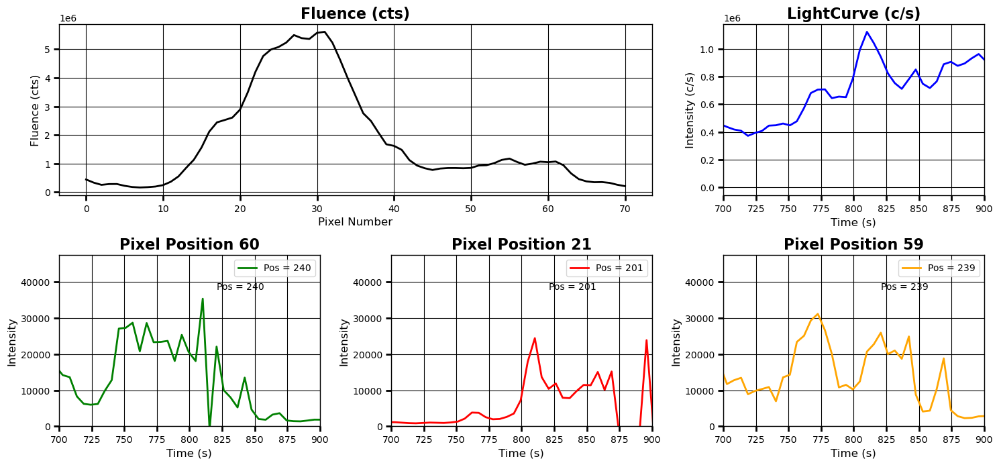

In [262]:
import matplotlib.pyplot as plt
# Set time ranges
time_plot_low = 100.0 * np.floor(time_arr[i_time_min] / 100.0)
time_plot_high = 100.0 * (np.floor(time_arr[i_time_max] / 100.0) + 1)
time_range = [time_plot_low, time_plot_high]

# Configure plot settings for clarity
axiscolor = "black"
backcolor = "white"
line_colors = ["black", "blue", "green", "red", "orange"]  # Colors for plots

# Configure plot settings for hardcopy
if hard == 1:
    plt.rcParams.update({
        "axes.titlesize": 16,
        "axes.labelsize": 12,
        "lines.linewidth": 2,
        "xtick.major.size": 6,
        "ytick.major.size": 6,
        "xtick.major.width": 2,
        "ytick.major.width": 2
    })
    axiscolor = "black"
    backcolor = "white"
    filename = Path(results_folder_name) / f"{event_date}_{region}_lightcurves.eps"
else:
    axiscolor = "black"
    backcolor = "white"

# Create figure and layout
fig, axs = plt.subplots(2, 1, figsize=(15, 10), gridspec_kw={'height_ratios': [1, 1]})
fig.patch.set_facecolor(backcolor)

# Top row: Fluence and LightCurve plots side-by-side
ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)  # Fluence plot
ax2 = plt.subplot2grid((3, 3), (0, 2))  # LightCurve plot

# Bottom row: Individual position subplots in one row (three horizontally aligned subplots)
pos_axs = [
    plt.subplot2grid((3, 3), (1, i), colspan=1) for i in range(3)
]

# Plot Fluence (cts)
ax1.plot(fluence_pixel, color=line_colors[0])
ax1.set_xlabel("Pixel Number", color=axiscolor)
ax1.set_ylabel("Fluence (cts)", color=axiscolor)
ax1.set_title("Fluence (cts)", color=axiscolor)
ax1.grid(True, color=axiscolor)
ax1.tick_params(colors=axiscolor)

# Plot Intensity Overall (LightCurve)
ax2.plot(time_arr, intensity_overall, color=line_colors[1])
ax2.set_xlabel("Time (s)", color=axiscolor)
ax2.set_ylabel("Intensity (c/s)", color=axiscolor)
ax2.set_xlim(time_range)
ax2.set_title("LightCurve (c/s)", color=axiscolor)
ax2.grid(True, color=axiscolor)
ax2.tick_params(colors=axiscolor)

# Individual Pixel Position Plots
for i_pos, ax in enumerate(pos_axs):
    if i_pos < n_pos:  # Limit to the number of positions available
        slit_pos = int(slit_pos_array[i_pos])
        ax.plot(
            time_arr,
            intensity_pixel_plot[:, slit_pos],
            label=f'Pos = {slit_pos + slit_pos_offset}',
            color=line_colors[i_pos + 2],
        )
        ax.set_ylim([0, np.max(intensity_pixel_plot)])
        ax.set_xlim(time_range)
        ax.set_xlabel("Time (s)", color=axiscolor)
        ax.set_ylabel("Intensity", color=axiscolor)
        ax.set_title(f"Pixel Position {slit_pos}", color=axiscolor)
        ax.legend()
        ax.grid(True, color=axiscolor)
        ax.tick_params(colors=axiscolor)

        # Simulate `xyouts` by adding annotations
        ax.annotate(
            f"Pos = {slit_pos + slit_pos_offset}",
            (time_arr[i_time_min + 5], 0.8 * np.max(intensity_pixel_plot)),
            color=axiscolor,
        )

# Save or show the figure
if hard == 1:
    filename = Path(results_folder_name) / f"{event_date}_{species}_{region}_lightcurves.eps"
    
    # Explicitly check and remove existing file to ensure overwriting
    if filename.exists():
        filename.unlink()  # Deletes the existing file
    
    plt.savefig(filename, format="eps", facecolor=fig.get_facecolor())
    plt.close()
else:
    plt.tight_layout()
    plt.show()

# Calculate intensity errors
intensity_err = np.empty_like(intensity)
for i_lambda in range(n_lambda):
    for i_time in range(n_time):
        for slit_pos in range(n_pixel):
            intensity_value = intensity[i_lambda, i_time, slit_pos]
            if intensity_value > 0:
                intensity_err[i_lambda, i_time, slit_pos] = np.sqrt(intensity_value)
            else:
                intensity_err[i_lambda, i_time, slit_pos] = np.sqrt(-intensity_value)

# Initialize Gaussian fit coefficient arrays
coeff_fit = np.zeros((n_time, n_pixel, 7), dtype=np.float64)
double_gauss_fit = np.zeros((n_lambda, n_time, n_pixel), dtype=np.float64)
gauss1_fit = np.zeros((n_lambda, n_time, n_pixel), dtype=np.float64)
gauss2_fit = np.zeros((n_lambda, n_time, n_pixel), dtype=np.float64)

In [263]:
from scipy.optimize import curve_fit
import numpy as np

# Replace zero intensity errors with machine epsilon to avoid division issues
intensity_err = np.where(intensity_err == 0, np.finfo(float).eps, intensity_err)

# Initialize output arrays with NaNs for problematic fits
coeff_fit = np.full((n_time, n_pixel, 7), np.nan)
gauss1_fit = np.full((n_lambda, n_time, n_pixel), np.nan)
gauss2_fit = np.full((n_lambda, n_time, n_pixel), np.nan)
double_gauss_fit = np.full((n_lambda, n_time, n_pixel), np.nan)

# Iterate over slit positions
for i_slit_pos in range(3):
    slit_pos = slit_pos_array[i_slit_pos]

    print(f"Slit Position = {slit_pos + slit_pos_offset}")

    # Define parameter limits
    param_limits = [
        (0, np.inf),  # Continuum level
        (0, np.inf),  # Intensity of first Gaussian
        (rest_wavelength - 0.1, rest_wavelength + 0.1),  # Centroid of first Gaussian
        (0.001, 0.2),  # Std deviation of first Gaussian
        (0, np.inf),  # Intensity of second Gaussian
        (rest_wavelength - 0.1, rest_wavelength + 0.2),  # Centroid of second Gaussian
        (0.001, 0.2),  # Std deviation of second Gaussian
    ]

    for i_time in range(n_time):
        # Skip if flagged as warning
        if warning_flag[i_time, slit_pos] == 1:
            continue

        # Define initial guesses for the fit parameters
        continuum_init = 0.0
        A1_init = np.max(intensity[:, i_time, slit_pos])
        mu1_init = rest_wavelength
        sigma1_init = 0.1
        A2_init = A1_init / 3.0
        mu2_init = rest_wavelength + 0.2
        sigma2_init = 0.1

        # Ensure initial guesses are within bounds
        start_params = [
            continuum_init,
            A1_init,
            mu1_init,
            sigma1_init,
            A2_init,
            mu2_init,
            sigma2_init,
        ]
        start_params = np.clip(
            start_params,
            [limit[0] for limit in param_limits],
            [limit[1] for limit in param_limits],
        )

        # Define bounds for curve_fit
        lower_bounds = [limit[0] for limit in param_limits]
        upper_bounds = [limit[1] for limit in param_limits]

        # Perform the fit
        try:
            popt, _ = curve_fit(
                lambda x, *c: double_gaussian(x, c),
                wavelength_arr,
                intensity[:, i_time, slit_pos],
                p0=start_params,
                sigma=intensity_err[:, i_time, slit_pos],
                bounds=(lower_bounds, upper_bounds),
                max_nfev=8192,
            )
            # Store the coefficients
            coeff_fit[i_time, slit_pos, :] = popt

            # Generate the Gaussian fits using the obtained parameters
            gauss1_fit[:, i_time, slit_pos] = (
                popt[1]
                * np.exp(
                    -((wavelength_arr - popt[2]) ** 2) / (2 * popt[3] ** 2)
                )
            )
            gauss2_fit[:, i_time, slit_pos] = (
                popt[4]
                * np.exp(
                    -((wavelength_arr - popt[5]) ** 2) / (2 * popt[6] ** 2)
                )
            )
            double_gauss_fit[:, i_time, slit_pos] = (
                popt[0] + gauss1_fit[:, i_time, slit_pos] + gauss2_fit[:, i_time, slit_pos]
            )
        except RuntimeError as e:
            # Log the skipped fit
            print(f"Skipping fit for time {i_time}, slit position {slit_pos}: {e}")

        except ValueError as e:
            print(f"ValueError for time {i_time}, slit position {slit_pos}: {e}")
            print(f"Start params: {start_params}")
            print(f"Bounds: {lower_bounds}, {upper_bounds}")

# Output: Problematic fits are marked with NaN while maintaining consistent array sizes.


Slit Position = 240
Skipping fit for time 7, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 9, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 16, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 17, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 21, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 24, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 29, slit position 60: Optimal parameters not found: The maximum number of function evaluations is exceeded.
Skipping fit for time 31, slit position 60: Optimal parameters not found

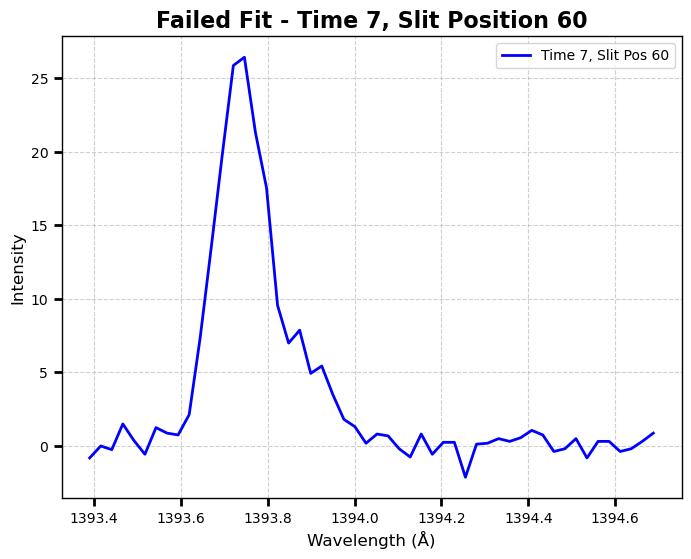

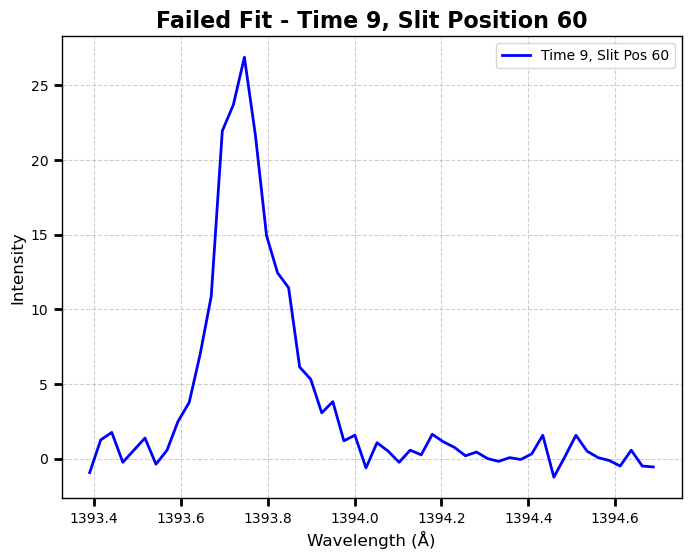

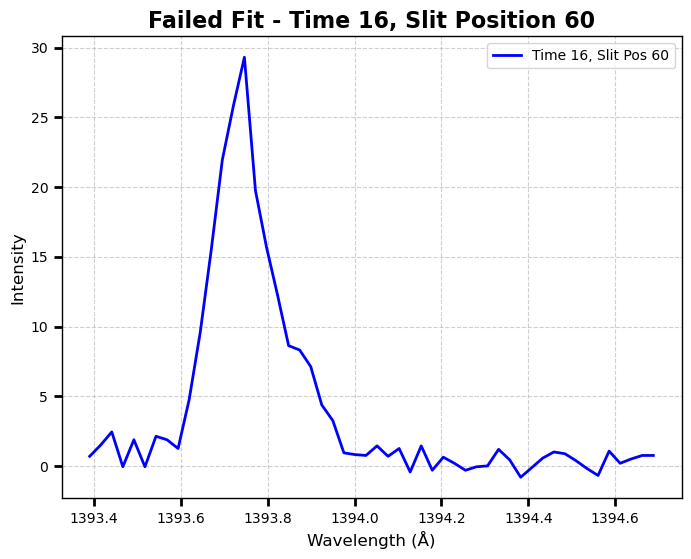

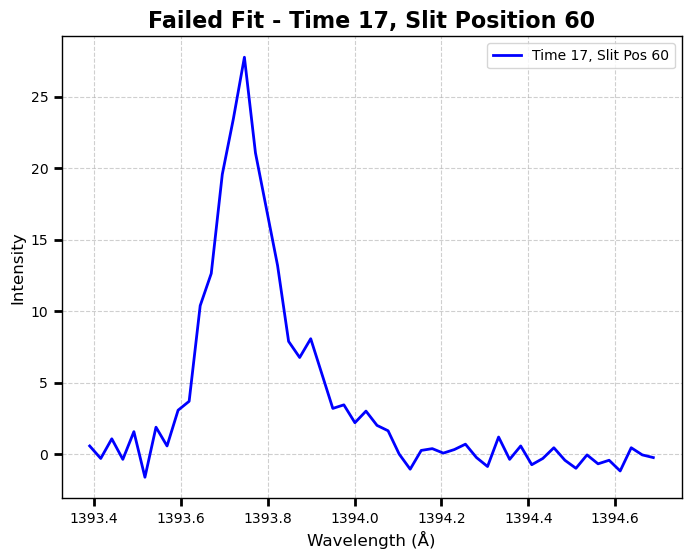

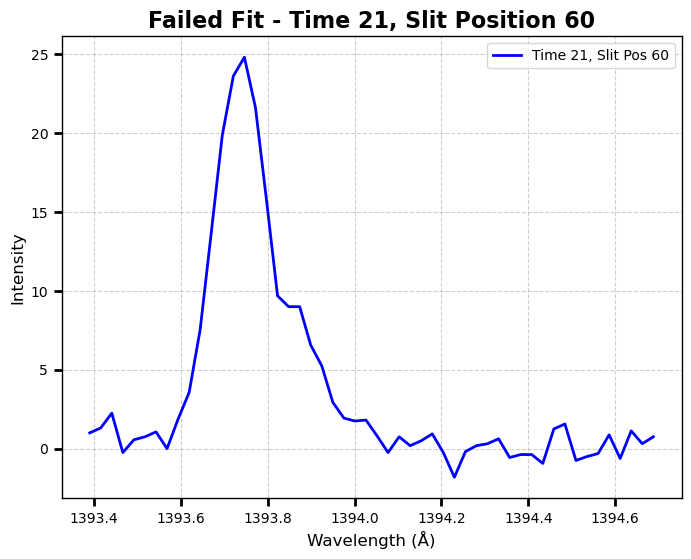

...

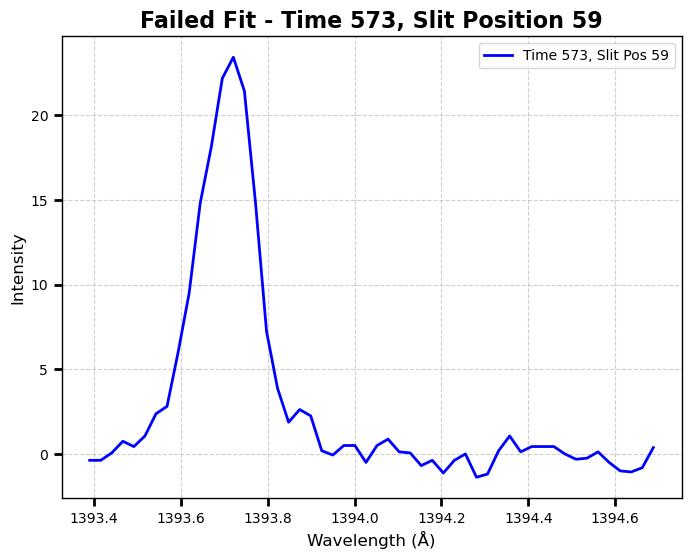

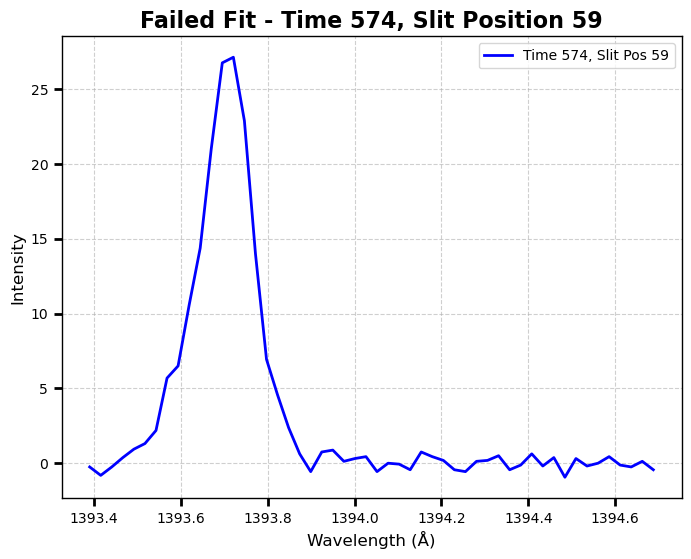

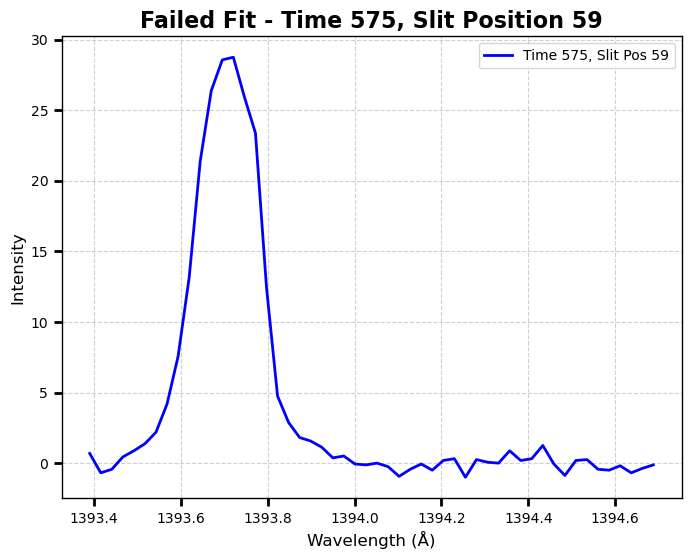

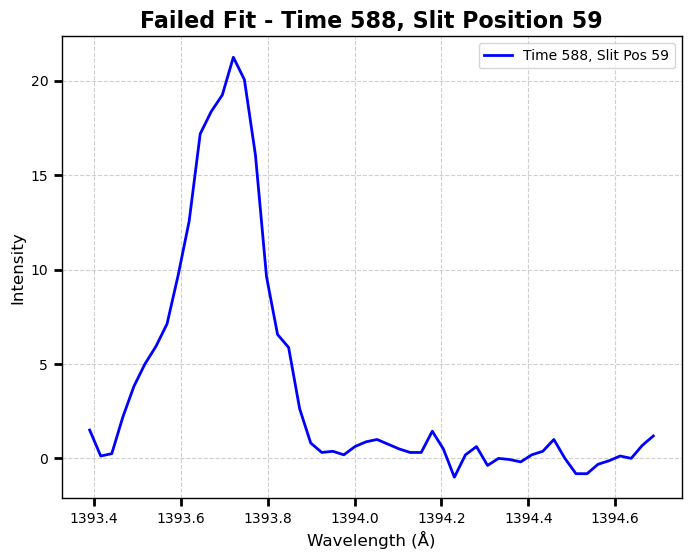

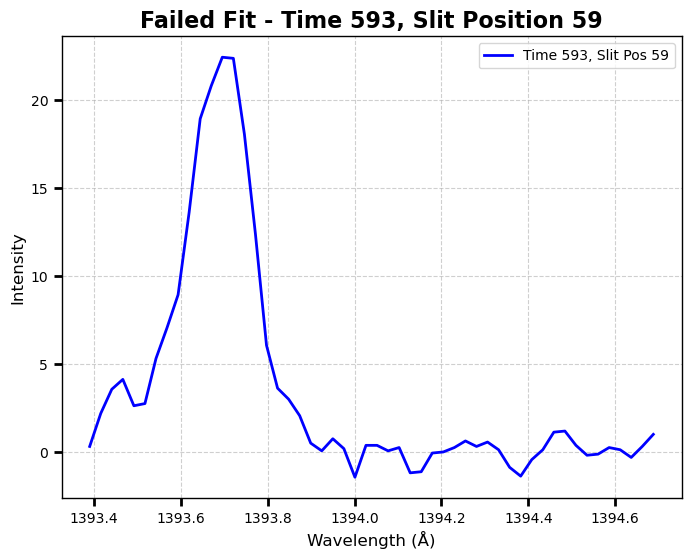

In [264]:
# print(coeff_fit)

# def inspect_problematic_fits(wavelength_arr, intensity, failed_indices):
#     """
#     Inspect and plot data for problematic fits.

#     Parameters:
#         wavelength_arr : ndarray
#             Array of wavelengths.
#         intensity : ndarray
#             Intensity data with shape (n_lambda, n_time, n_slit_positions).
#         failed_indices : list of tuples
#             List of (time, slit_position) indices where the fit failed.
#     """
#     for i_time, slit_pos in failed_indices:
#         # Extract the data for the problematic time and slit position
#         data = intensity[:, i_time, slit_pos]
        
#         # Plot the data
#         plt.figure(figsize=(8, 6))
#         plt.plot(wavelength_arr, data, label=f"Time {i_time}, Slit Pos {slit_pos}")
#         plt.title(f"Inspection of Failed Fit\nTime = {i_time}, Slit Pos = {slit_pos}")
#         plt.xlabel("Wavelength (Angstrom)")
#         plt.ylabel("Intensity")
#         plt.grid(True, linestyle="--", alpha=0.7)
#         plt.legend()
#         plt.show()

# # Example usage
# failed_indices = []  # Populate with the indices where fits failed
# for i_time in range(n_time):
#     for slit_pos in slit_pos_array:
#         if np.all(coeff_fit[i_time, slit_pos, :] == np.nan):  # Adjust condition based on how failures are flagged
#             failed_indices.append((i_time, slit_pos))

# # Call the inspection function
# inspect_problematic_fits(wavelength_arr, intensity, failed_indices)

# Ensure coeff_fit is initialized as expected and NaNs are present for failed fits
if np.isnan(coeff_fit).all():
    print("No valid fits found. Ensure the coeff_fit array contains results.")
else:
    # Loop through all time and slit position combinations
    for i_slit_pos in range(3):
        slit_pos = slit_pos_array[i_slit_pos]
        for i_time in range(n_time):
            # Check if the fit for this time/slit position is marked as NaN
            if np.isnan(coeff_fit[i_time, slit_pos]).any():
                # Plot wavelength vs. intensity for this failed fit
                plt.figure(figsize=(8, 6))
                plt.plot(
                    wavelength_arr,
                    intensity[:, i_time, slit_pos],
                    label=f"Time {i_time}, Slit Pos {slit_pos}",
                    color="blue",
                )
                plt.xlabel("Wavelength (Å)")
                plt.ylabel("Intensity")
                plt.title(
                    f"Failed Fit - Time {i_time}, Slit Position {slit_pos}"
                )
                plt.legend()
                plt.grid(True, linestyle="--", alpha=0.6)
                plt.show()

Slit Position = 240


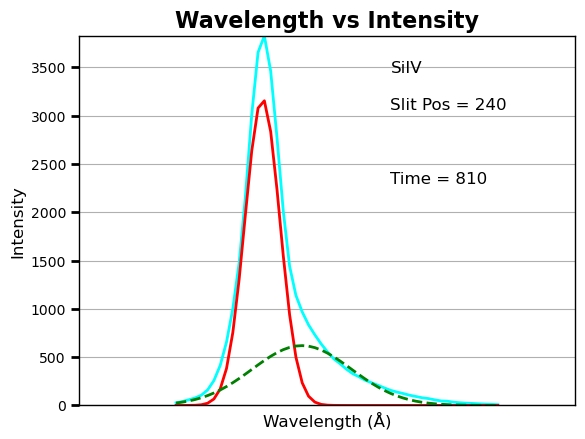

Slit Position = 201


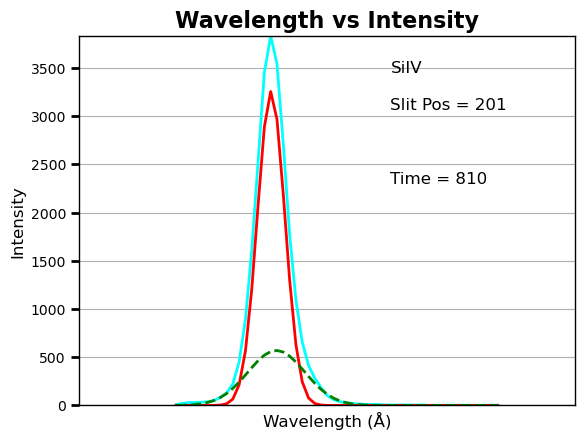

Slit Position = 239


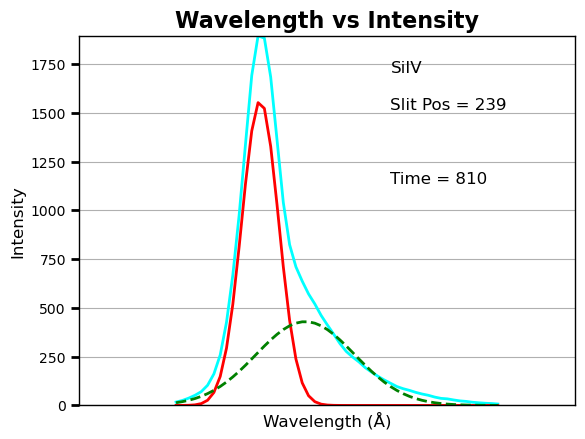

In [267]:
# For each slit position
for i_pos_plot in range(3):
    slit_pos = slit_pos_array[i_pos_plot]
    print(f"Slit Position = {slit_pos + slit_pos_offset}")

    # Prepare the plot
    if hard == 0:
        fig, ax = plt.subplots()
        ax.set_facecolor('white')
        ax.tick_params(axis='x', labelcolor='black')
        ax.tick_params(axis='y', labelcolor='black')
        ax.set_title('Wavelength vs Intensity', color='black')
    else:
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.set_facecolor('white')
        ax.tick_params(axis='x', labelcolor='black')
        ax.tick_params(axis='y', labelcolor='black')
        ax.set_title('Wavelength vs Intensity', color='black')

        # Set filename for saving
        filename = f"{results_folder_name}{event_date}_{region}_{species}_double_gaussian_fit_" \
                   f"{str(slit_pos_array[i_pos_plot] + slit_pos_offset).zfill(3)}_time_" \
                   f"{str(round(time_arr[brightest_time])).zfill(3)}.eps"
        plt.savefig(filename, format='eps', dpi=300)

    # Plot the intensity and Gaussian fits
    ax.plot(wavelength_arr, intensity[:, brightest_time, slit_pos], label='Observed Intensity', color='cyan')

    ax.plot(wavelength_arr, gauss1_fit[:, brightest_time, slit_pos], linestyle='-', color='red', label='Gaussian 1')
    ax.plot(wavelength_arr, gauss2_fit[:, brightest_time, slit_pos], linestyle='--', color='green', label='Gaussian 2')

    if species == "SiIV1394":
        plot_offset = 0.5
    if species == "SiIV1403":
        plot_offset = 0.5
    if species == "O_IV1401":
        plot_offset = -1.0
    # Annotating the plot with position and time
    ax.text(rest_wavelength + plot_offset, 0.8 * np.max(intensity[:, brightest_time, slit_pos]), 
            f'Slit Pos = {slit_pos + slit_pos_offset}', color='black', fontsize=12)
    ax.text(rest_wavelength + plot_offset, 0.6 * np.max(intensity[:, brightest_time, slit_pos]), 
            f'Time = {round(time_arr[brightest_time])}', color='black', fontsize=12)
    ax.text(rest_wavelength + plot_offset, 0.9 * np.max(intensity[:, brightest_time, slit_pos]), 
            species[:4], color='black', fontsize=12)

    ax.set_xlabel('Wavelength (Å)')
    ax.set_ylabel('Intensity')

    # Adjust plot limits
    ax.set_xlim(np.floor(np.min(wavelength_arr)), np.floor(np.max(wavelength_arr) + 1))
    ax.set_ylim(0, np.max(intensity[:, brightest_time, slit_pos]))

    # Set tick frequency and appearance
    ax.xaxis.set_major_locator(plt.MultipleLocator(4))

    # If saving, close the plot
    if hard == 1:
        plt.close(fig)
    else:
        plt.show()

In [268]:
# Ensure the averaging_time_interval is even
if averaging_time_interval % 2 != 0:
    averaging_time_interval += 1

# Initialize coeff_fit_avg
coeff_fit_avg = np.zeros((n_time, n_pixel, 7))

# Perform averaging over the time interval
for i_slit_pos in range(n_pixel):
    for j in range(7):  # Iterate over coefficients
        for i_time in range(averaging_time_interval // 2, n_time - averaging_time_interval // 2):
            # Select the range of values to average
            values_to_be_averaged = coeff_fit[
                i_time - averaging_time_interval // 2 : i_time + averaging_time_interval // 2 + 1,
                i_slit_pos,
                j,
            ]
            # Exclude zero values before averaging
            non_zero_values = values_to_be_averaged[values_to_be_averaged != 0]
            coeff_fit_avg[i_time, i_slit_pos, j] = (
                np.mean(non_zero_values) if non_zero_values.size > 0 else 0
            )

# Initialize arrays for main and shifted parameters
int_average_main = np.zeros(n_pixel)
int_average_shifted = np.zeros(n_pixel)
v_average_main = np.zeros(n_pixel)
v_average_shifted = np.zeros(n_pixel)
width_excess_average_main = np.zeros(n_pixel)
width_excess_average_shifted = np.zeros(n_pixel)
int_stdev_main = np.zeros(n_pixel)
int_stdev_shifted = np.zeros(n_pixel)
v_stdev_main = np.zeros(n_pixel)
v_stdev_shifted = np.zeros(n_pixel)
width_stdev_main = np.zeros(n_pixel)
width_stdev_shifted = np.zeros(n_pixel)

In [272]:
print(valid_intensity_main.shape)

(507,)


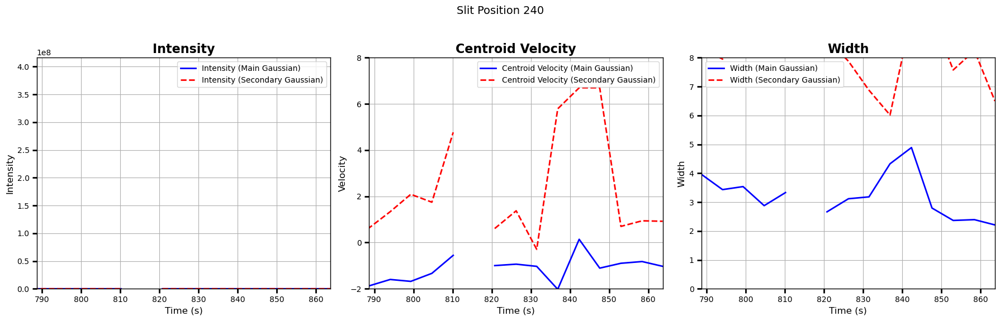

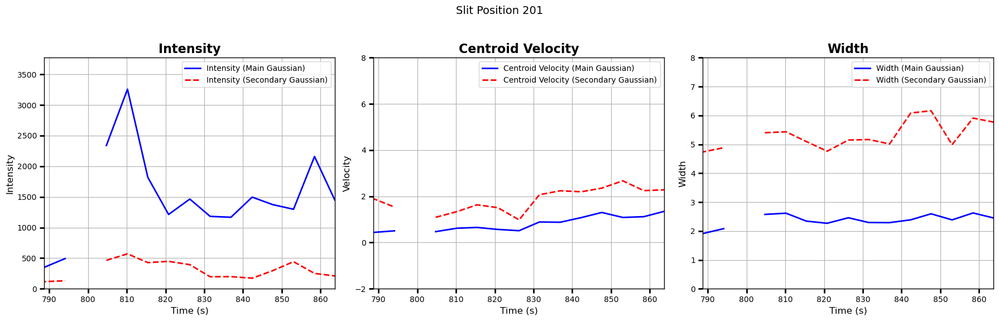

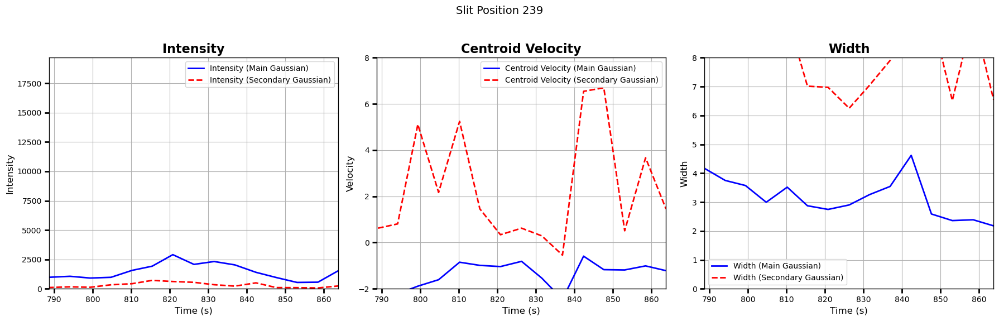

In [ ]:
# Calculate plotting bounds
i_time_plot_low = int(i_time_min - 1 + averaging_time_interval / 2)
i_time_plot_high = int(i_time_max - 1 - averaging_time_interval / 2)
time_plot_low = time_arr[i_time_plot_low]
time_plot_high = time_arr[i_time_plot_high]
time_range_avg = [time_plot_low, time_plot_high]

# Loop over each slit position
for i_pos in range(n_pos):
    slit_pos = slit_pos_array[i_pos]
    slit_pos_offset_label = slit_pos + slit_pos_offset

    # Filter valid (non-NaN) data for plotting
    valid_intensity_main = coeff_fit[:, slit_pos, 1][~np.isnan(coeff_fit[:, slit_pos, 1])]
    valid_intensity_secondary = coeff_fit[:, slit_pos, 4][~np.isnan(coeff_fit[:, slit_pos, 4])]
    valid_velocity_main = (coeff_fit[:, slit_pos, 2] - rest_wavelength) * (3e10 / v_thermal) / rest_wavelength
    valid_velocity_secondary = (coeff_fit[:, slit_pos, 5] - rest_wavelength) * (3e10 / v_thermal) / rest_wavelength
    valid_width_main = np.sqrt(2) * coeff_fit[:, slit_pos, 3] * (3e10 / v_thermal) / rest_wavelength
    valid_width_secondary = np.sqrt(2) * coeff_fit[:, slit_pos, 6] * (3e10 / v_thermal) / rest_wavelength

    # Create a figure for each slit position
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Slit Position {slit_pos_offset_label}", fontsize=14)

    # Plot intensity
    ax1 = axes[0]
    ax1.plot(time_arr, coeff_fit[:, slit_pos, 1], label="Intensity (Main Gaussian)", color="blue")
    ax1.plot(time_arr, coeff_fit[:, slit_pos, 4], label="Intensity (Secondary Gaussian)", linestyle="--", color="red")
    ax1.set_title("Intensity")
    ax1.set_xlim(time_range_avg)
    ax1.set_ylim(0, max(np.nanmax(valid_intensity_main), np.nanmax(valid_intensity_secondary)))
    ax1.set_xlabel("Time (s)")
    ax1.set_ylabel("Intensity")
    ax1.legend()

    # Plot centroid velocity
    ax2 = axes[1]
    ax2.plot(time_arr, valid_velocity_main, label="Centroid Velocity (Main Gaussian)", color="blue")
    ax2.plot(time_arr, valid_velocity_secondary, label="Centroid Velocity (Secondary Gaussian)", linestyle="--", color="red")
    ax2.set_title("Centroid Velocity")
    ax2.set_xlim(time_range_avg)
    ax2.set_ylim(-2, 8)
    ax2.set_xlabel("Time (s)")
    ax2.set_ylabel("Velocity")
    ax2.legend()

    # Plot widths
    ax3 = axes[2]
    ax3.plot(time_arr, valid_width_main, label="Width (Main Gaussian)", color="blue")
    ax3.plot(time_arr, valid_width_secondary, label="Width (Secondary Gaussian)", linestyle="--", color="red")
    ax3.set_title("Width")
    ax3.set_xlim(time_range_avg)
    ax3.set_ylim(0, 8)
    ax3.set_xlabel("Time (s)")
    ax3.set_ylabel("Width")
    ax3.legend()

    # Adjust layout and save/show
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for subtitle
    if hard == 0:
        plt.show()
    else:
        filename = (
            f"{results_folder_name}{event_date}_{region}_{species}_fit_parameters_"
            f"{str(slit_pos_offset_label).zfill(3)}.eps"
        )
        plt.savefig(filename, format="eps", dpi=300)
        plt.close(fig)


In [273]:
# Initialize arrays to store values
n_time_avg = i_time_max - i_time_min
xx = np.zeros(n_time_avg)
xxx = np.zeros(n_time_avg)
yy = np.zeros(n_time_avg)
yyy = np.zeros(n_time_avg)
zz = np.zeros(n_time_avg)
zzz = np.zeros(n_time_avg)

# Calculate averages and standard deviations
for i_pos in range(n_pos):
    for i_time_avg in range(n_time_avg):
        time_index = i_time_avg + i_time_min
        xx[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 1]
        xxx[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 4]
        yy[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 2]
        yyy[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 5]
        zz[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 3]
        zzz[i_time_avg] = coeff_fit[time_index, slit_pos_array[i_pos], 6]

    # Filter out NaN values
    valid_xx = xx[~np.isnan(xx) & (xx != 0)]
    valid_xxx = xxx[~np.isnan(xxx) & (xxx != 0)]
    valid_yy = yy[~np.isnan(yy) & (yy != 0)]
    valid_yyy = yyy[~np.isnan(yyy) & (yyy != 0)]
    valid_zz = zz[~np.isnan(zz) & (zz != 0)]
    valid_zzz = zzz[~np.isnan(zzz) & (zzz != 0)]

    # Main component calculations
    int_average_main[i_pos] = np.mean(valid_xx)
    int_stdev_main[i_pos] = np.std(valid_xx)
    int_average_shifted[i_pos] = np.mean(valid_xxx)
    int_stdev_shifted[i_pos] = np.std(valid_xxx)

    v_average_main[i_pos] = (np.mean(valid_yy) - rest_wavelength) * (3e10 / v_thermal) / rest_wavelength
    v_stdev_main[i_pos] = np.std(valid_yy) * (3e10 / v_thermal) / rest_wavelength
    v_average_shifted[i_pos] = (np.mean(valid_yyy) - rest_wavelength) * (3e10 / v_thermal) / rest_wavelength
    v_stdev_shifted[i_pos] = np.std(valid_yyy) * (3e10 / v_thermal) / rest_wavelength

    width_excess_average_main[i_pos] = np.sqrt(2) * np.mean(valid_zz) * (3e10 / v_thermal) / rest_wavelength
    width_stdev_main[i_pos] = np.sqrt(2) * np.std(valid_zz) * (3e10 / v_thermal) / rest_wavelength
    width_excess_average_shifted[i_pos] = np.sqrt(2) * np.mean(valid_zzz) * (3e10 / v_thermal) / rest_wavelength
    width_stdev_shifted[i_pos] = np.sqrt(2) * np.std(valid_zzz) * (3e10 / v_thermal) / rest_wavelength

# Determine tabular file index based on region and species
tabular_file_name = f"{results_folder_name}{event_date}_{region}_{species}_tabular.txt"

# Write tabular results to a file
with open(tabular_file_name, "w") as f:
    f.write(f"{event_date}      {region}    {species}\n\n")
    f.write("Main Component\n")
    for i_pos in range(n_pos):
        slit_position = slit_pos_array[i_pos] + slit_pos_offset
        excess_width_main = np.sqrt(width_excess_average_main[i_pos] ** 2 - inst_width ** 2 - 1)
        f.write(f"\nSlit Position {slit_position}\n")
        f.write(f"Intensity: {int_average_main[i_pos]} ± {int_stdev_main[i_pos]}\n")
        f.write(f"Centroid Velocity: {v_average_main[i_pos]} ± {v_stdev_main[i_pos]}\n")
        f.write(f"Excess Width: {excess_width_main} ± {width_stdev_main[i_pos]}\n")

    f.write("\nShifted Component\n")
    for i_pos in range(n_pos):
        slit_position = slit_pos_array[i_pos] + slit_pos_offset
        excess_width_shifted = np.sqrt(width_excess_average_shifted[i_pos] ** 2 - inst_width ** 2 - 1)
        f.write(f"\nSlit Position {slit_position}\n")
        f.write(f"Intensity: {int_average_shifted[i_pos]} ± {int_stdev_shifted[i_pos]}\n")
        f.write(f"Centroid Velocity: {v_average_shifted[i_pos]} ± {v_stdev_shifted[i_pos]}\n")
        f.write(f"Excess Width: {excess_width_shifted} ± {width_stdev_shifted[i_pos]}\n")

print(f"Tabular results written to {tabular_file_name}")


Tabular results written to E:\Simon_Files\oct252014\GraphicResults25Oct2014_Region1_SiIV1394_tabular.txt
